In [1]:
from IPython import get_ipython
from IPython.display import display

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install tensorflow


# **Exploring the Data**

In [4]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential, load_model
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import VGG16, VGG19, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import precision_score, recall_score, f1_score



In [5]:
train_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train'
test_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test'
val_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation'


# Check folder existence
for dir_path in [train_dir, test_dir, val_dir]:
    print(" Found:" if os.path.exists(dir_path) else " Not Found:", dir_path)

 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train
 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test
 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation


In [6]:
def count_images_in_subfolders(parent_dir):
    print(f"\n Scanning: {parent_dir}")

    if not os.path.exists(parent_dir):
        print(" Directory not found!")
        return

    for subfolder in sorted(os.listdir(parent_dir)):
        sub_path = os.path.join(parent_dir, subfolder)
        if os.path.isdir(sub_path):
            image_count = len([
                f for f in os.listdir(sub_path)
                if os.path.isfile(os.path.join(sub_path, f))
            ])
            print(f"    {subfolder}: {image_count} images")

# Use your corrected paths
print(" TRAIN DATA")
count_images_in_subfolders(train_dir)

print("\n TEST DATA")
count_images_in_subfolders(test_dir)

print("\n VALIDATION DATA")
count_images_in_subfolders(val_dir)


 TRAIN DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train
    Healthy: 458 images
    Powdery: 430 images
    Rust: 434 images

 TEST DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test
    Healthy: 50 images
    Powdery: 50 images
    Rust: 50 images

 VALIDATION DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation
    Healthy: 20 images
    Powdery: 20 images
    Rust: 20 images


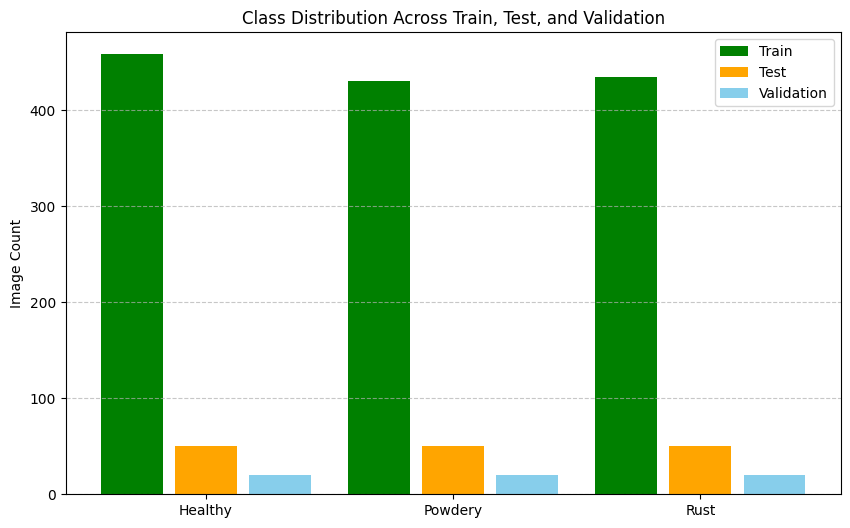

In [7]:
import matplotlib.pyplot as plt


labels = ['Healthy', 'Powdery', 'Rust']
train_counts = [458, 430, 434]
test_counts = [50, 50, 50]
val_counts = [20, 20, 20]

x = range(len(labels))

plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(x, train_counts, width=0.25, label='Train', color='green', align='center')
plt.bar([i + 0.3 for i in x], test_counts, width=0.25, label='Test', color='orange')
plt.bar([i + 0.6 for i in x], val_counts, width=0.25, label='Validation', color='skyblue')

plt.xticks([i + 0.3 for i in x], labels)
plt.ylabel('Image Count')
plt.title('Class Distribution Across Train, Test, and Validation')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# **Data Augmentation**

In [8]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

In [9]:
def load_dataset(directory, augment=False):
    ds = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        image_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        shuffle=True,
        seed=SEED
    )
    class_names = ds.class_names

    if augment:
        aug = tf.keras.Sequential([
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.RandomFlip("horizontal"),
            tf.keras.layers.RandomRotation(0.2),
            tf.keras.layers.RandomZoom(0.2),
            tf.keras.layers.RandomContrast(0.2)
        ])
        ds = ds.map(lambda x, y: (aug(x), y))
    else:
        ds = ds.map(lambda x, y: (x / 255.0, y))

    return ds.prefetch(tf.data.AUTOTUNE), class_names

train_ds, class_names = load_dataset(train_dir, augment=True)
val_ds, _ = load_dataset(val_dir)
test_ds, _ = load_dataset(test_dir)
# class_names is now defined
print("Classes:", class_names)

Found 1322 files belonging to 3 classes.
Found 60 files belonging to 3 classes.
Found 150 files belonging to 3 classes.
Classes: ['Healthy', 'Powdery', 'Rust']


In [10]:
# Compute class weights
def compute_class_weights(directory):
    count = {}
    for cls in os.listdir(directory):
        cls_path = os.path.join(directory, cls)
        count[cls] = len(os.listdir(cls_path))
    total = sum(count.values())
    class_weights = {i: total / (len(count) * count[c]) for i, c in enumerate(sorted(count))}
    return class_weights

class_weights = compute_class_weights(train_dir)

# **Basic CNN**

In [11]:
# --- BASIC CNN ---
def build_basic_cnn(num_classes):
    inputs = tf.keras.Input((*IMG_SIZE, 3))
    x = tf.keras.layers.Conv2D(32, 3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [13]:
def train_model():
    model = build_basic_cnn(num_classes=len(class_names))
    model.summary()

    checkpoint = ModelCheckpoint(
        filepath='best_basic_cnn_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,
        class_weight=class_weights,
        callbacks=[checkpoint]
    )

    return model, history

model, history = train_model()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,347 (42.61 MB)

 Trainable params: 11,169,347 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5186 - loss: 1.0508
Epoch 1: val_accuracy improved from -inf to 0.73333, saving model to best_basic_cnn_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.5216 - loss: 1.0452 - val_accuracy: 0.7333 - val_loss: 0.5905
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8294 - loss: 0.4588
Epoch 2: val_accuracy improved from 0.73333 to 0.90000, saving model to best_basic_cnn_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 447ms/step - accuracy: 0.8299 - loss: 0.4575 - val_accuracy: 0.9000 - val_loss: 0.4153
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.9063 - loss: 0.2715
Epoch 3: val_accuracy did not improve from 0.90000
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 427ms/step - accuracy: 0.9064 - loss: 0.2716 - val_accuracy: 0.9000 - val_loss: 0.3171
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.9266 - loss: 0.2406
Epoch 4: val_accuracy improved from 0.90000 to 0.91667, saving

In [14]:
model.save('final_basic_cnn_model.keras')

In [17]:
best_model = load_model('best_basic_cnn_model.keras')

In [18]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = best_model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Precision, Recall, F1-Score
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.86      0.96      0.91        50
     Powdery       0.94      0.88      0.91        50
        Rust       1.00      0.94      0.97        50

    accuracy                           0.93       150
   macro avg       0.93      0.93      0.93       150
weighted avg       0.93      0.93      0.93       150


Precision: 0.9311
Recall: 0.9267
F1 Score: 0.9273


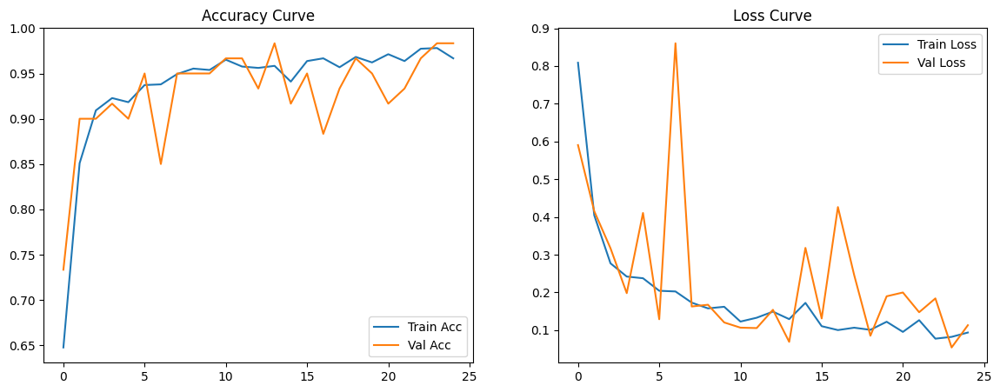

In [19]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
              precision    recall  f1-score   support

     Healthy       0.85      1.00      0.92        50
     Powdery       0.98      0.86      0.91        50
        Rust       1.00      0.94      0.97        50

    accuracy                           0.93       150
   macro avg       0.94      0.93      0.93       150
weighted avg       0.94      0.93      0.93       150



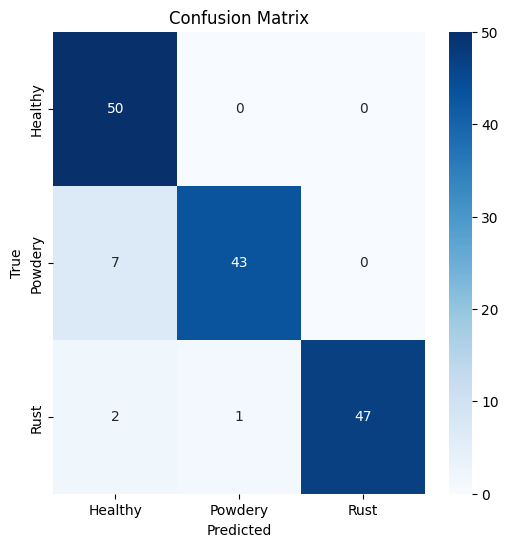

In [20]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [21]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 295ms/step - accuracy: 0.9339 - loss: 0.3448
 Test Accuracy: 93.33%
 Test Loss: 0.3510


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


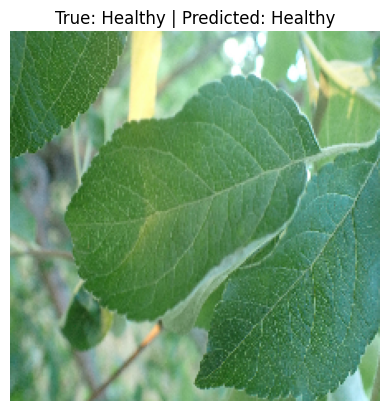

In [22]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


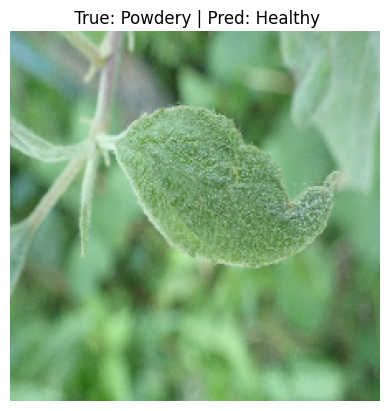

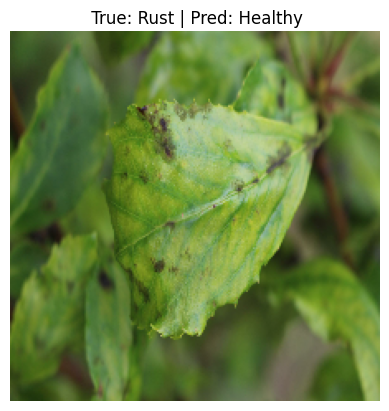

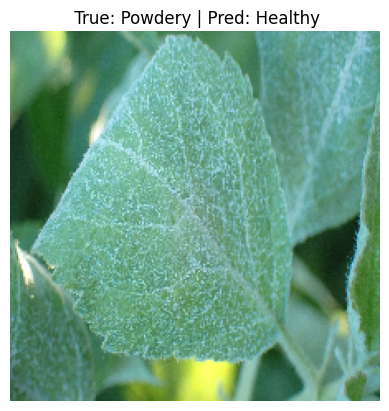

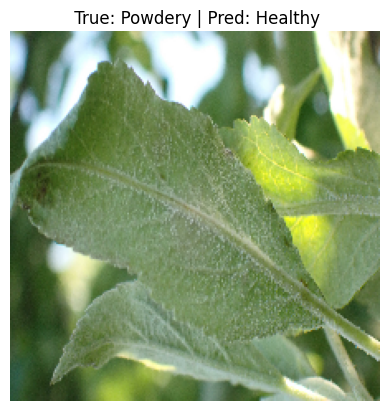

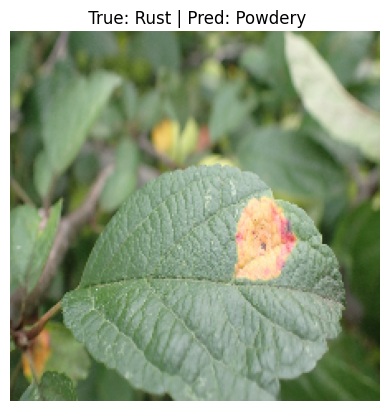

In [23]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()


# VGG16 Model

In [11]:
def build_vgg16_model(num_classes):
    base_model = VGG16(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [12]:
def train_model():
    model = build_vgg16_model(len(class_names))
    model.summary()

    checkpoint = ModelCheckpoint(
        filepath='best_vgg16_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,
        class_weight=class_weights,
        callbacks=[checkpoint]
    )

    return model, history

model, history = train_model()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,780,739 (56.38 MB)

 Trainable params: 66,051 (258.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3536 - loss: 1.1228
Epoch 1: val_accuracy improved from -inf to 0.53333, saving model to best_vgg16_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 0.3555 - loss: 1.1212 - val_accuracy: 0.5333 - val_loss: 0.9056
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.5570 - loss: 0.9131
Epoch 2: val_accuracy improved from 0.53333 to 0.73333, saving model to best_vgg16_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 436ms/step - accuracy: 0.5575 - loss: 0.9124 - val_accuracy: 0.7333 - val_loss: 0.7309
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.6654 - loss: 0.7764
Epoch 3: val_accuracy did not improve from 0.73333
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 433ms/step - accuracy: 0.6656 - loss: 0.7762 - val_accuracy: 0.7000 - val_loss: 0.6627
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.6937 - loss: 0.7025
Epoch 4: val_accuracy improved from 0.73333 to 0.83333, saving model t

In [13]:
model.save('final_vgg16_model.keras')

In [14]:
model.load_weights('best_vgg16_model.keras')

In [16]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Precision, Recall, F1-Score
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.80      0.82      0.81        50
     Powdery       0.95      0.76      0.84        50
        Rust       0.71      0.84      0.77        50

    accuracy                           0.81       150
   macro avg       0.82      0.81      0.81       150
weighted avg       0.82      0.81      0.81       150


Precision: 0.8219
Recall: 0.8067
F1 Score: 0.8090


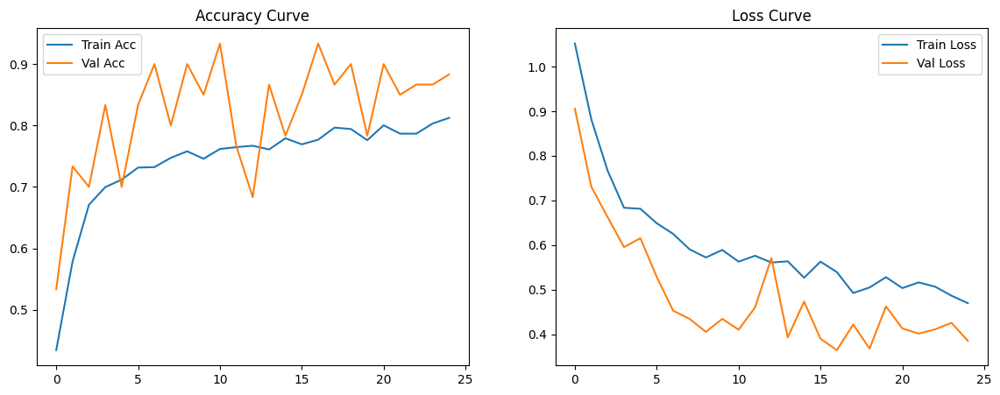

In [17]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
              precision    recall  f1-score   support

     Healthy       0.80      0.82      0.81        50
     Powdery       0.95      0.76      0.84        50
        Rust       0.71      0.84      0.77        50

    accuracy                           0.81       150
   macro avg       0.82      0.81      0.81       150
weighted avg       0.82      0.81      0.81       150



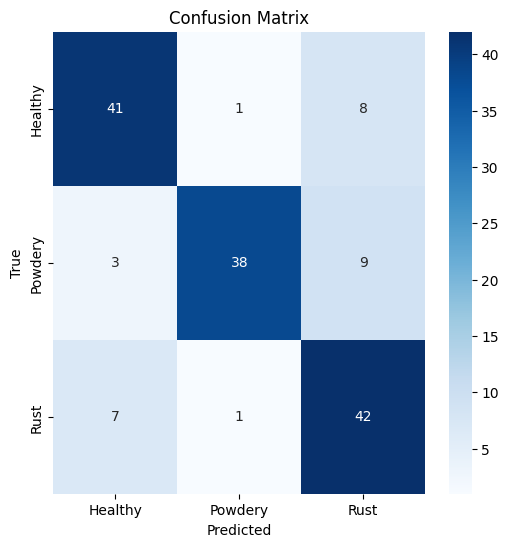

In [18]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [19]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 441ms/step - accuracy: 0.8171 - loss: 0.5059
 Test Accuracy: 80.67%
 Test Loss: 0.5186


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


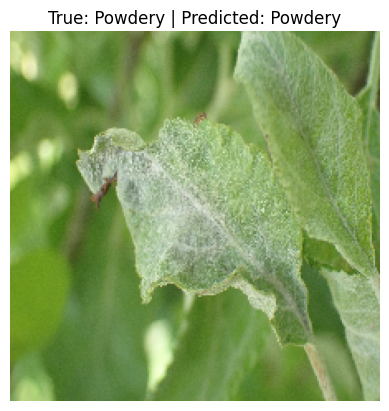

In [20]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


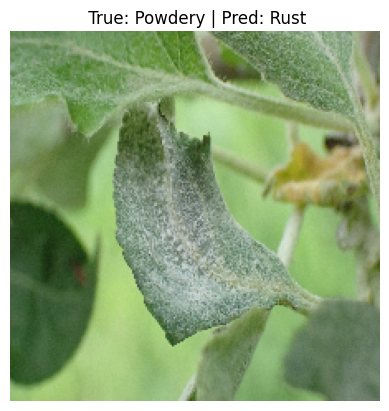

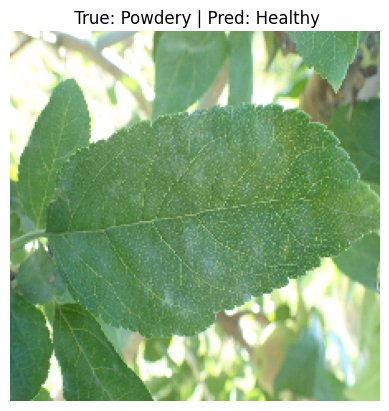

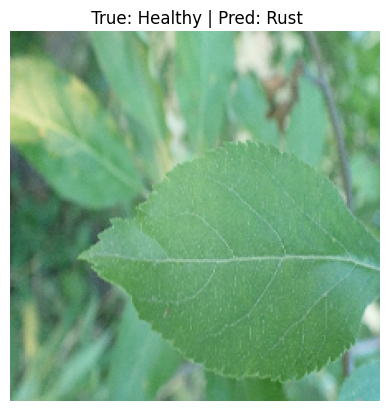

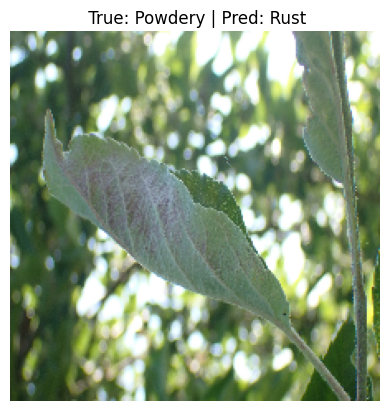

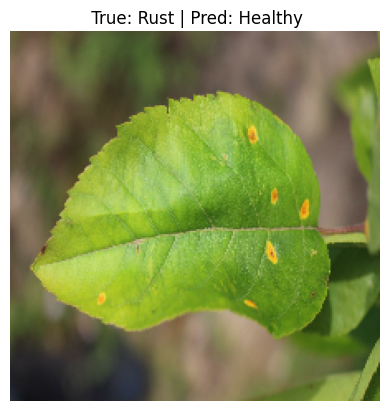

In [21]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# VGG19 Model

In [12]:
def build_vgg19_model(num_classes):
    base_model = VGG19(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [13]:
def train_model():
    model = build_vgg19_model(len(class_names))
    model.summary()

    checkpoint = ModelCheckpoint(
        filepath='best_vgg19_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,
        class_weight=class_weights,
        callbacks=[checkpoint]
    )

    return model, history

model, history = train_model()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,090,435 (76.64 MB)

 Trainable params: 66,051 (258.01 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3612 - loss: 1.1492
Epoch 1: val_accuracy improved from -inf to 0.43333, saving model to best_vgg19_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 93s 2s/step - accuracy: 0.3623 - loss: 1.1482 - val_accuracy: 0.4333 - val_loss: 0.9693
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.5090 - loss: 0.9980
Epoch 2: val_accuracy improved from 0.43333 to 0.71667, saving model to best_vgg19_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 445ms/step - accuracy: 0.5095 - loss: 0.9975 - val_accuracy: 0.7167 - val_loss: 0.8134
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.6178 - loss: 0.8638
Epoch 3: val_accuracy did not improve from 0.71667
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 435ms/step - accuracy: 0.6180 - loss: 0.8635 - val_accuracy: 0.7000 - val_loss: 0.7241
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step - accuracy: 0.6471 - loss: 0.8147
Epoch 4: val_accuracy improved from 0.71667 to 0.85000, saving model t

In [14]:
model.save('final_vgg19_model.keras')

In [15]:
model.load_weights('best_vgg19_model.keras')

In [17]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Precision, Recall, F1-Score
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.76      0.94      0.84        50
     Powdery       0.90      0.86      0.88        50
        Rust       0.93      0.74      0.82        50

    accuracy                           0.85       150
   macro avg       0.86      0.85      0.85       150
weighted avg       0.86      0.85      0.85       150


Precision: 0.8596
Recall: 0.8467
F1 Score: 0.8464


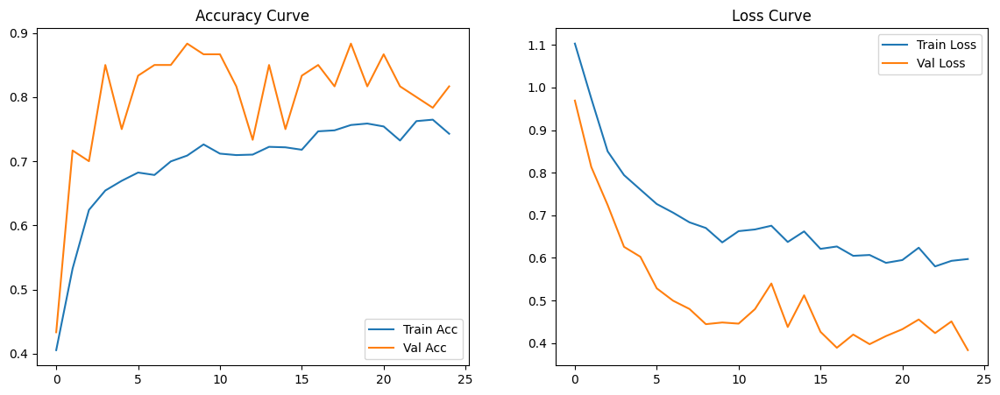

In [18]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
              precision    recall  f1-score   support

     Healthy       0.76      0.94      0.84        50
     Powdery       0.90      0.86      0.88        50
        Rust       0.93      0.74      0.82        50

    accuracy                           0.85       150
   macro avg       0.86      0.85      0.85       150
weighted avg       0.86      0.85      0.85       150



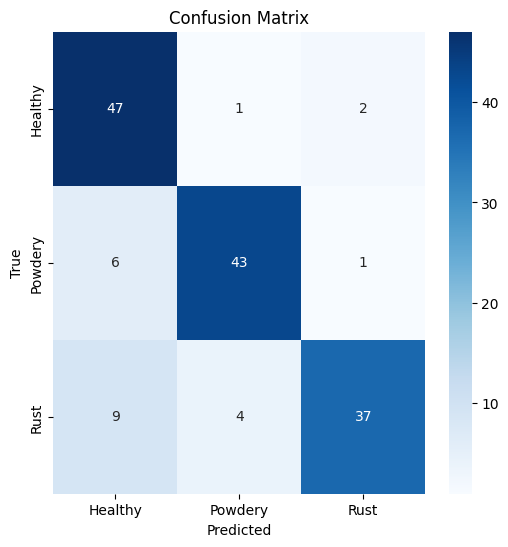

In [19]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [20]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 467ms/step - accuracy: 0.8547 - loss: 0.4970
 Test Accuracy: 84.67%
 Test Loss: 0.5181


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


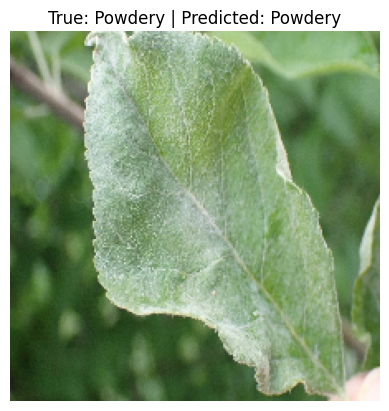

In [22]:
import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


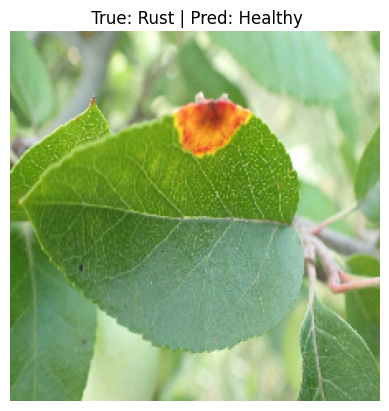

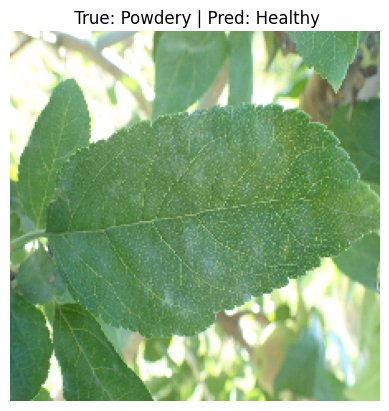

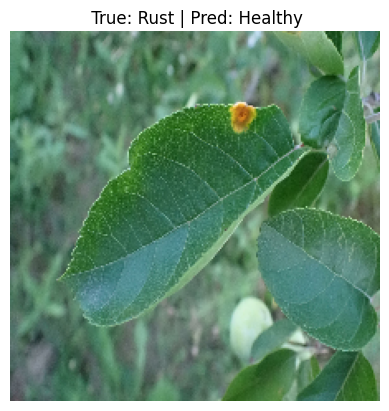

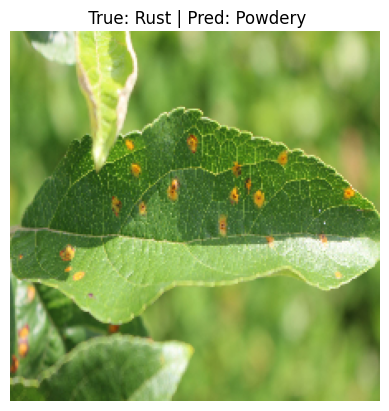

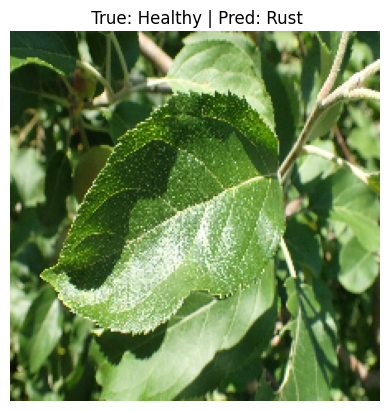

In [23]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# ResNet50

In [11]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [12]:
def build_resnet50_model(num_classes):
    base_model = ResNet50(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.4)(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [13]:
def train_model():
    model = build_resnet50_model(len(class_names))
    model.summary()

    checkpoint = ModelCheckpoint(
        filepath='best_resnet50_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,
        class_weight=class_weights,
        callbacks=[checkpoint]
    )

    return model, history

model, history = train_model()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,850,883 (90.98 MB)

 Trainable params: 262,915 (1.00 MB)

 Non-trainable params: 23,587,968 (89.98 MB)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3532 - loss: 1.5217
Epoch 1: val_accuracy improved from -inf to 0.33333, saving model to best_resnet50_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.3531 - loss: 1.5204 - val_accuracy: 0.3333 - val_loss: 1.0996
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step - accuracy: 0.3350 - loss: 1.3665
Epoch 2: val_accuracy improved from 0.33333 to 0.51667, saving model to best_resnet50_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 20s 451ms/step - accuracy: 0.3352 - loss: 1.3663 - val_accuracy: 0.5167 - val_loss: 1.0734
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.3425 - loss: 1.2644
Epoch 3: val_accuracy did not improve from 0.51667
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 435ms/step - accuracy: 0.3425 - loss: 1.2643 - val_accuracy: 0.3833 - val_loss: 1.0646
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.3527 - loss: 1.2537
Epoch 4: val_accuracy did not improve from 0.51667
42/42 ━━━━━━━

In [14]:
model.save('final_resnet50_model.keras')

In [15]:
model.load_weights('best_resnet50_model.keras')

In [16]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Precision, Recall, F1-Score
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.00      0.00      0.00        50
     Powdery       0.36      0.92      0.51        50
        Rust       0.43      0.18      0.25        50

    accuracy                           0.37       150
   macro avg       0.26      0.37      0.26       150
weighted avg       0.26      0.37      0.26       150


Precision: 0.2617
Recall: 0.3667
F1 Score: 0.2558


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

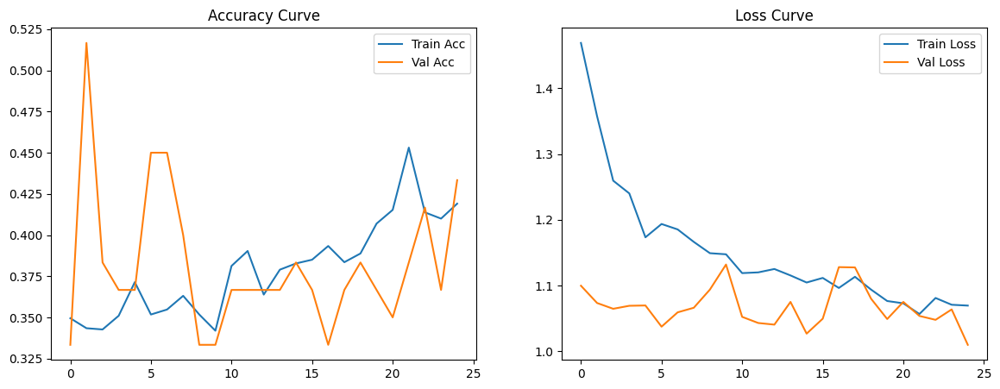

In [17]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
              precision    recall  f1-score   support

     Healthy       0.00      0.00      0.00        50
     Powdery       0.36      0.92      0.51        50
        Rust       0.43      0.18      0.25        50

    accuracy                           0.37       150
   macro avg       0.26      0.37      0.26       150
weighted avg       0.26      0.37      0.26       150



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


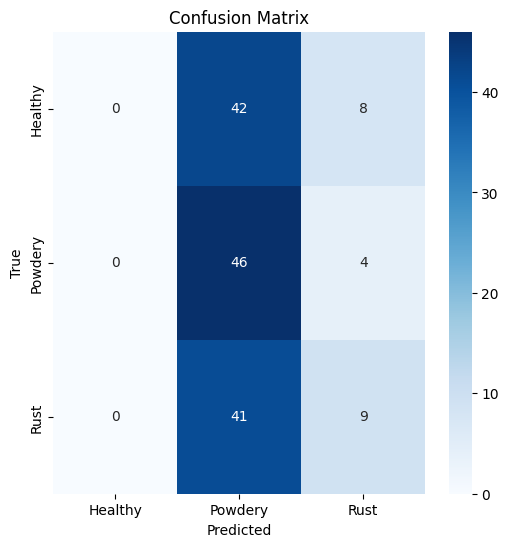

In [18]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [19]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 677ms/step - accuracy: 0.3553 - loss: 1.0885
 Test Accuracy: 36.67%
 Test Loss: 1.0898


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


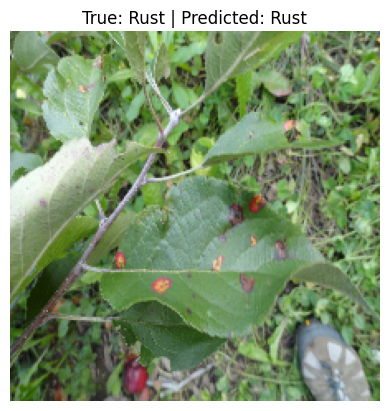

In [20]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


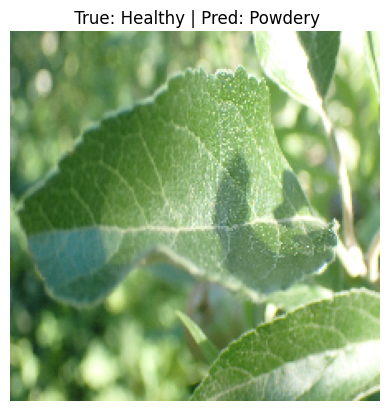

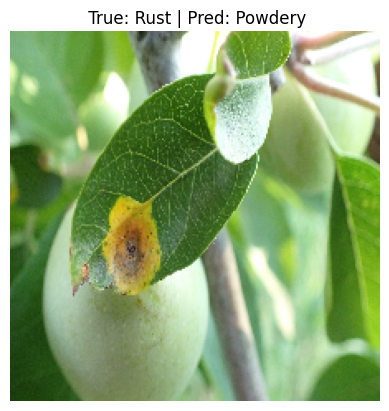

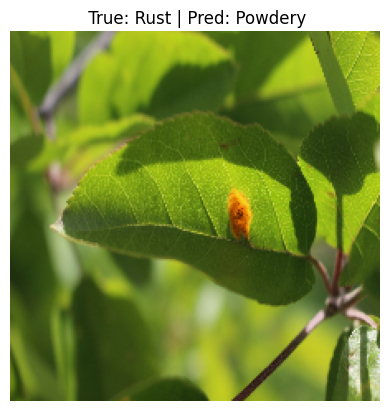

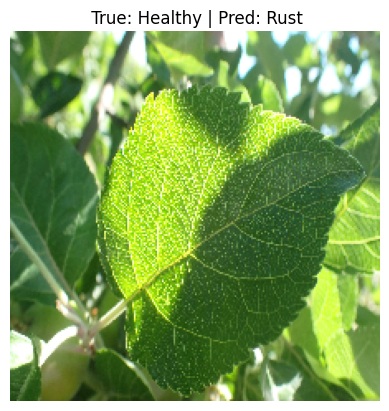

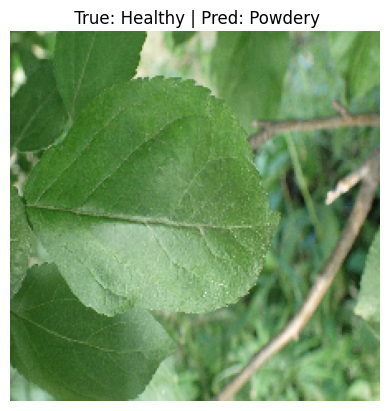

In [21]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# **InseptionResNetV2**

In [11]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

def build_inception_resnet(num_classes):
    base_model = InceptionResNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    base_model.trainable = False  # Freeze base for transfer learning

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model


In [12]:
def train_model():
    model = build_inception_resnet(num_classes=len(class_names))
    model.summary()

    checkpoint = ModelCheckpoint(
        filepath='best_inception_resnet2_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=25,
        class_weight=class_weights,
        callbacks=[checkpoint]
    )

    return model, history

model, history = train_model()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 54,737,123 (208.81 MB)

 Trainable params: 397,315 (1.52 MB)

 Non-trainable params: 54,339,808 (207.29 MB)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4595 - loss: 1.4952
Epoch 1: val_accuracy improved from -inf to 0.81667, saving model to best_inception_resnet2_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 130s 2s/step - accuracy: 0.4619 - loss: 1.4876 - val_accuracy: 0.8167 - val_loss: 0.5628
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step - accuracy: 0.7532 - loss: 0.6413
Epoch 2: val_accuracy improved from 0.81667 to 0.93333, saving model to best_inception_resnet2_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 21s 498ms/step - accuracy: 0.7535 - loss: 0.6410 - val_accuracy: 0.9333 - val_loss: 0.3697
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.7916 - loss: 0.5834
Epoch 3: val_accuracy improved from 0.93333 to 0.95000, saving model to best_inception_resnet2_model.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 22s 496ms/step - accuracy: 0.7920 - loss: 0.5822 - val_accuracy: 0.9500 - val_loss: 0.2811
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.7917 - lo

In [13]:
model.save('final_inception_resnet2_model.keras')

In [14]:
model.load_weights('best_inception_resnet2_model.keras')

In [15]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Precision, Recall, F1-Score
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.86      0.96      0.91        50
     Powdery       0.98      0.88      0.93        50
        Rust       0.94      0.92      0.93        50

    accuracy                           0.92       150
   macro avg       0.92      0.92      0.92       150
weighted avg       0.92      0.92      0.92       150


Precision: 0.9246
Recall: 0.9200
F1 Score: 0.9204


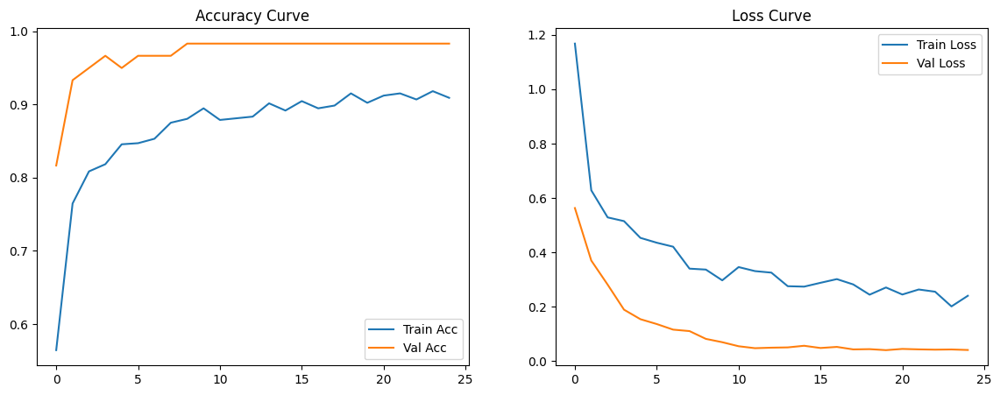

In [17]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
              precision    recall  f1-score   support

     Healthy       0.86      0.96      0.91        50
     Powdery       0.98      0.88      0.93        50
        Rust       0.94      0.92      0.93        50

    accuracy                           0.92       150
   macro avg       0.92      0.92      0.92       150
weighted avg       0.92      0.92      0.92       150



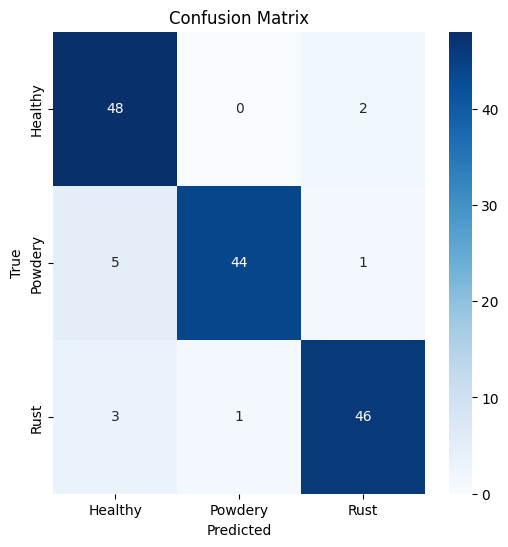

In [18]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [19]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9026 - loss: 0.2138
 Test Accuracy: 92.00%
 Test Loss: 0.1968


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


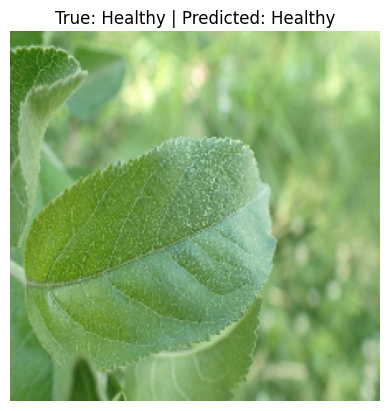

In [21]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


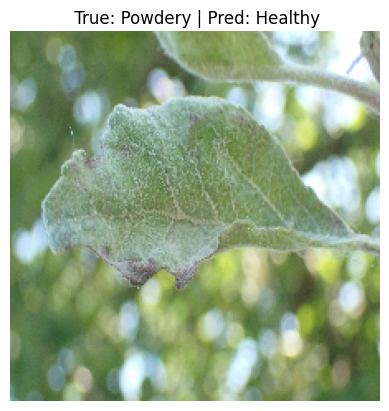

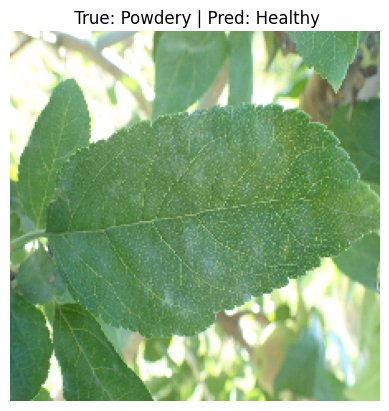

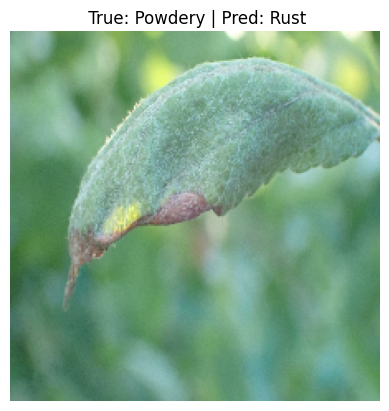

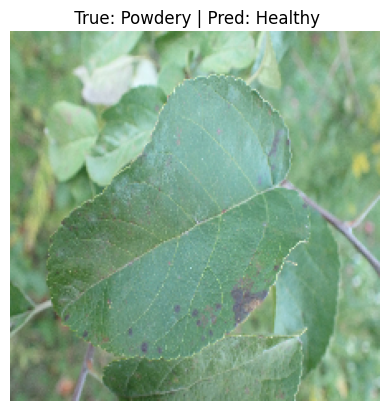

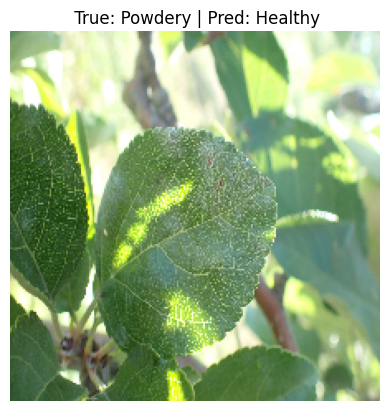

In [22]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)


for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()